In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import yfinance as yf
df = yf.download('AAPL', start='2020-01-01', end='2020-12-31')
df['PCT'] = (df['Close'] - df['Open'])/df['Open']
y = df.PCT.values


In [6]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.fft import fft, fftfreq

# Set seed for reproducibility
np.random.seed(42)

# Generate time vector
N = len(y)  # number of samples
T = 1.0 / 1000.0  # sampling interval
x = np.linspace(0.0, N*T, N, endpoint=False)



In [ ]:

# Create a signal with multiple sine waves + noise
freqs_true = [50, 120, 300]  # true frequencies in Hz
amps = [1.0, 2.5, 0.2]       # amplitudes of the sine waves
signal = np.sum([amp * np.sin(2 * np.pi * freq * x) for amp, freq in zip(amps, freqs_true)], axis=0)

# Add Gaussian noise
noise = 0 #0.5 * np.random.normal(size=N)
noise = 1.5 * np.random.normal(size=N)
signal_noisy = signal  + noise

# Perform FFT
yf = fft(signal_noisy)
xf = fftfreq(N, T)[:N//2]  # Only take the positive frequencies

# Plot the time-domain and frequency-domain signals
fig, axs = plt.subplots(2, 1, figsize=(12, 8))

# Time-domain signal
axs[0].plot(x, signal_noisy, label="Noisy Signal")
axs[0].set_title("Time-Domain Signal")
axs[0].set_xlabel("Time [s]")
axs[0].set_ylabel("Amplitude")
axs[0].legend()

# Frequency-domain spectrum
axs[1].stem(xf, 2.0/N * np.abs(yf[0:N//2]))
axs[1].set_title("Frequency Spectrum")
axs[1].set_xlabel("Frequency [Hz]")
axs[1].set_ylabel("Magnitude")
axs[1].set_xlim(0, 500)

plt.tight_layout()
plt.show()


In [ ]:
import pandas as pd
# Reconstruct the original signal using inverse FFT with scaled down coefficients
# Scale down high frequency components to reduce overfitting
scaling_factor = 0.1  # Adjust this value between 0 and 1 to control smoothing
scaled_yf = yf.copy()
scaled_yf[N//4:] *= scaling_factor  # Scale down higher frequencies more aggressively
reconstructed_signal = np.fft.ifft(scaled_yf)

# Plot original and reconstructed signals
plt.figure(figsize=(15, 6))
plt.plot(x, signal_noisy, label='Original Signal', alpha=0.5)
plt.plot(x, reconstructed_signal.real, label='Reconstructed Signal (Smoothed)', linestyle='--')
plt.title('Original vs Reconstructed Signal (with Frequency Scaling)')
plt.xlabel('Time [s]')
plt.ylabel('Amplitude')
plt.legend()
plt.grid(True)

# Create DataFrame with frequency components
freq_components = pd.DataFrame({
    'xf': xf,
    'y': 2.0/N * np.abs(scaled_yf[0:N//2])  # Use scaled coefficients
})

In [ ]:
# Keep only the strongest frequency components (those with highest amplitudes)
# Sort frequencies by their amplitude and keep top N components
N_components = 10  # Number of strongest frequencies to keep
sorted_indices = np.argsort(np.abs(yf))[::-1]  # Sort by magnitude, descending
filtered_yf = np.zeros_like(yf)
filtered_yf[sorted_indices[:N_components]] = yf[sorted_indices[:N_components]]

# Reconstruct signal using only the strongest components
reconstructed_signal = np.fft.ifft(filtered_yf)

# Plot original and reconstructed signals
plt.figure(figsize=(15, 6))
plt.plot(x, signal_noisy, label='Original Signal', alpha=0.5)
plt.plot(x, reconstructed_signal.real, label='Reconstructed Signal (Top Frequencies)', linestyle='--')
plt.title('Original vs Reconstructed Signal (Using Top {} Frequencies)'.format(N_components))
plt.xlabel('Time [s]')
plt.ylabel('Amplitude')
plt.legend()
plt.grid(True)

# Create DataFrame with frequency components
freq_components = pd.DataFrame({
    'xf': xf,
    'y': 2.0/N * np.abs(filtered_yf[0:N//2])  # Use filtered coefficients
})

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, mean_absolute_error

def generate_sample_data():
    """Generate sample time series data with multiple periodic components."""
    np.random.seed(42)
    # Generate time points for 2 years worth of daily data
    t = np.linspace(0, 4*np.pi, 730)  # 2*pi/365 scaling for yearly periodicity
    # Create signal with yearly and half-yearly seasonality plus noise
    signal = 2*np.sin(t) + 0.5*np.sin(2*t) + 0.2*np.random.randn(len(t))
    return t, signal

def split_data(t, signal, train_ratio=0.5):
    """Split data into train and test sets (1 year each)."""
    train_size = int(len(signal) * train_ratio)
    train_signal = signal[:train_size]
    test_signal = signal[train_size:]
    train_t = t[:train_size]
    test_t = t[train_size:]
    return train_t, test_t, train_signal, test_signal

def perform_fft(signal, t, N_components=10):
    """Perform FFT and keep strongest frequency components."""
    N = len(signal)
    yf = np.fft.fft(signal)
    xf = np.fft.fftfreq(N, d=t[1]-t[0])
    
    # Keep only the strongest frequency components
    sorted_indices = np.argsort(np.abs(yf))[::-1]  # Sort by magnitude, descending
    filtered_yf = np.zeros_like(yf)
    filtered_yf[sorted_indices[:N_components]] = yf[sorted_indices[:N_components]]
    
    return filtered_yf, sorted_indices, N

def predict_future(t, filtered_yf, sorted_indices, N_train, N_components):
    """Predict future values using learned frequency components."""
    N = len(t)
    yf_new = np.zeros(N, dtype=complex)
    
    # Copy the learned frequency components
    for i in range(N_components):
        idx = sorted_indices[i]
        # Handle both positive and negative frequencies
        if idx < N_train//2:
            # Positive frequency
            yf_new[idx] = filtered_yf[idx]
            # Negative frequency (mirror image)
            if idx > 0:  # Skip DC component (idx=0)
                yf_new[N-idx] = filtered_yf[N_train-idx]
    
    # Inverse FFT to get predictions
    return np.fft.ifft(yf_new).real

def plot_results(train_t, train_signal, train_reconstructed, 
                test_t, test_signal, test_predictions):
    """Plot the results of the Fourier Transform prediction."""
    plt.figure(figsize=(15, 6))
    plt.plot(train_t, train_signal, label='Training Data (Year 1)', alpha=0.5)
    plt.plot(train_t, train_reconstructed, label='Training Reconstruction', linestyle='--')
    plt.plot(test_t, test_signal, label='Test Data (Year 2)', alpha=0.5)
    plt.plot(test_t, test_predictions, label='Test Predictions', linestyle='--')
    plt.title('Fourier Transform-based Time Series Prediction')
    plt.xlabel('Time (t*2π/365)')
    plt.ylabel('Amplitude')
    plt.legend()
    plt.grid(True)
    plt.show()


# Generate data for 2 years
t, signal = generate_sample_data()
fig, axs = plt.subplots(3, 1, figsize = (15,15))
axs[0].plot(t, signal, linewidth=2, color='blue')
axs[0].set_title('Generated Time Series Data', fontsize=12, pad=10)
axs[0].set_xlabel('Time (t*2π/365)', fontsize=10)
axs[0].set_ylabel('Amplitude', fontsize=10)
axs[0].grid(True, linestyle='--', alpha=0.7)
axs[0].tick_params(axis='both', which='major', labelsize=9)

# # Split into year 1 (training) and year 2 (test)
train_t, test_t, train_signal, test_signal = split_data(t, signal)

# # Perform FFT on training data
filtered_yf, sorted_indices, N = perform_fft(train_signal, train_t)

# # Reconstruct training signal
train_reconstructed = np.fft.ifft(filtered_yf).real

# # Make predictions for test set (year 2)
test_predictions = predict_future(test_t, filtered_yf, sorted_indices, N, N_components=10)

# # Calculate error metrics
mse = mean_squared_error(test_signal, test_predictions)
mae = mean_absolute_error(test_signal, test_predictions)

print(f"Mean Squared Error: {mse:.4f}")
print(f"Mean Absolute Error: {mae:.4f}")

# # Plot results showing continuous timeline from year 1 to year 2
plot_results(train_t, train_signal, train_reconstructed,
            test_t, test_signal, test_predictions)


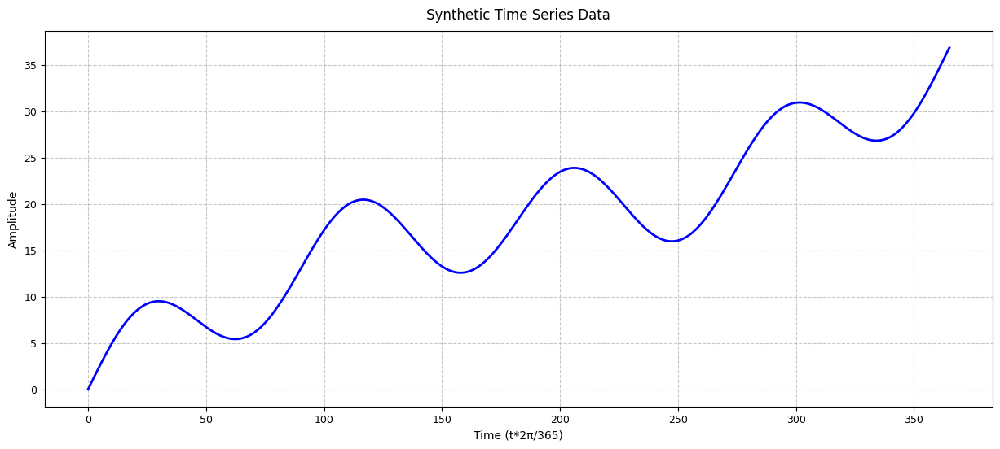

In [156]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split

# Set random seed for reproducibility
# np.random.seed(42)

# Generate synthetic data (365 days)
def generate_synthetic_data(n_days=365):
    t = np.linspace(0, n_days, n_days)
    
    # Create a trend
    trend = 0.1 * t
    # Add seasonal patterns (yearly and quarterly)
    yearly_pattern = 4.3 * np.sin(2 * np.pi * t / 365)
    quarterly_pattern = 5 * np.sin(2 * np.pi * t / 91)
    
    # Add some random noise
    noise = np.random.normal(0, 0, n_days)
    
    # Combine all components
    signal = trend + yearly_pattern + quarterly_pattern + noise
    return t, signal

# Generate data
t, signal = generate_synthetic_data()
plt.figure(figsize=(15, 6))
plt.plot(t, signal, linewidth=2, color='blue')
plt.title('Synthetic Time Series Data', fontsize=12, pad=10)
plt.xlabel('Time (t*2π/365)', fontsize=10)
plt.ylabel('Amplitude', fontsize=10)
plt.grid(True, linestyle='--', alpha=0.7)
plt.tick_params(axis='both', which='major', labelsize=9)
plt.show()

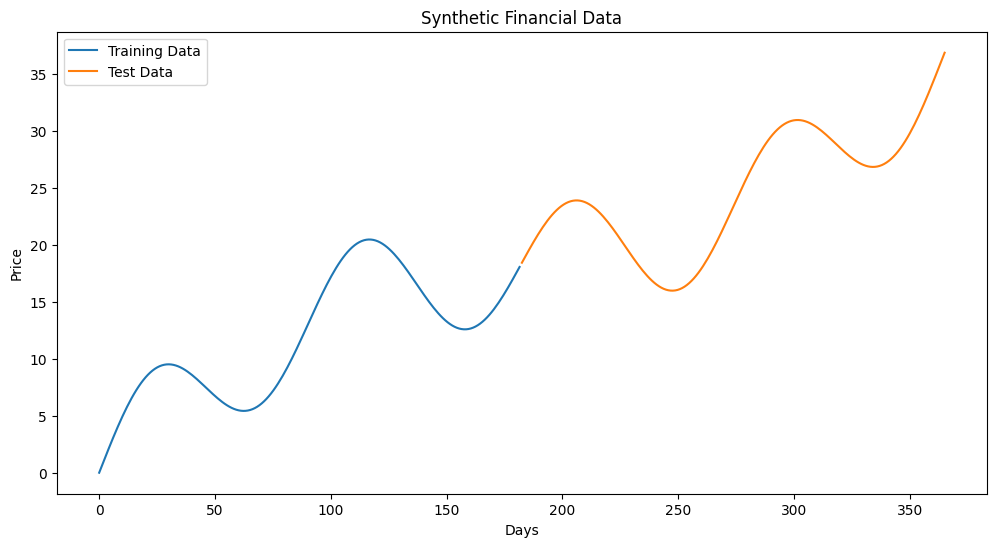

In [158]:
# Split into train and test
train_size = int(0.5 * len(signal))
t_train, t_test = t[:train_size], t[train_size:]
signal_train, signal_test = signal[:train_size], signal[train_size:]

# Plot original data
plt.figure(figsize=(12, 6))
plt.plot(t_train, signal_train, label='Training Data')
plt.plot(t_test, signal_test, label='Test Data')
plt.title('Synthetic Financial Data')
plt.xlabel('Days')
plt.ylabel('Price')
plt.legend()
plt.show()

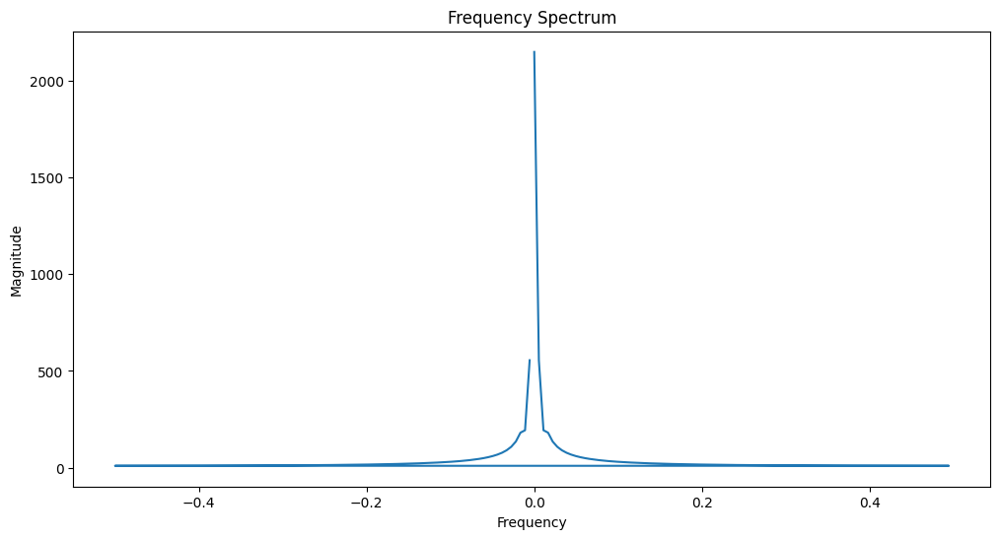

In [159]:
# Apply FFT to training data
fft_result = np.fft.fft(signal_train)
frequencies = np.fft.fftfreq(len(t_train))
# Plot frequency spectrum
plt.figure(figsize=(12, 6))
plt.plot(frequencies, np.abs(fft_result))
plt.title('Frequency Spectrum')
plt.xlabel('Frequency')
plt.ylabel('Magnitude')
plt.show()


In [162]:

# Filter out low magnitude frequencies
magnitude_threshold = np.percentile(np.abs(fft_result), 0)  # Keep top 10% frequencies
filtered_fft = fft_result.copy()
filtered_fft[np.abs(filtered_fft) < magnitude_threshold] = 0

# Inverse FFT to reconstruct signal
reconstructed_train = np.real(np.fft.ifft(filtered_fft))

def predict_future(t_future, filtered_fft, t_train, signal_train):
    # Get the last point of training data for continuity
    last_train_value = signal_train[-1]
    
    # Store the mean of the training data
    signal_mean = np.mean(signal_train)
    
    # Create frequency components for prediction
    frequencies = np.fft.fftfreq(len(t_train))
    predictions = np.zeros(len(t_future))
    
    # Add the periodic components
    for freq, amp in zip(frequencies, filtered_fft):
        if amp != 0:  # Only use significant frequencies
            predictions += np.abs(amp) * np.cos(2 * np.pi * freq * t_future + 
                                              np.angle(amp))
    
    predictions = predictions / len(t_train)
    predictions += signal_mean
    
    # Calculate trend
    slope = (signal_train[-1] - signal_train[0]) / (t_train[-1] - t_train[0])
    trend = slope * (t_future - t_train[-1])  # Note: using t_train[-1] as reference
    
    # Adjust predictions to ensure continuity
    # Calculate the offset at the boundary
    initial_prediction = predictions[0] + trend[0]
    offset = last_train_value - initial_prediction
    
    # Add trend and offset to maintain continuity
    return predictions + trend + offset

# Modify the prediction part of the main code:
predictions = predict_future(t_test, filtered_fft, t_train, signal_train)

/var/folders/zg/dk0qffx55tj5q4d2hvpp5m2c0000gn/T/ipykernel_85943/1965632975.py:46: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


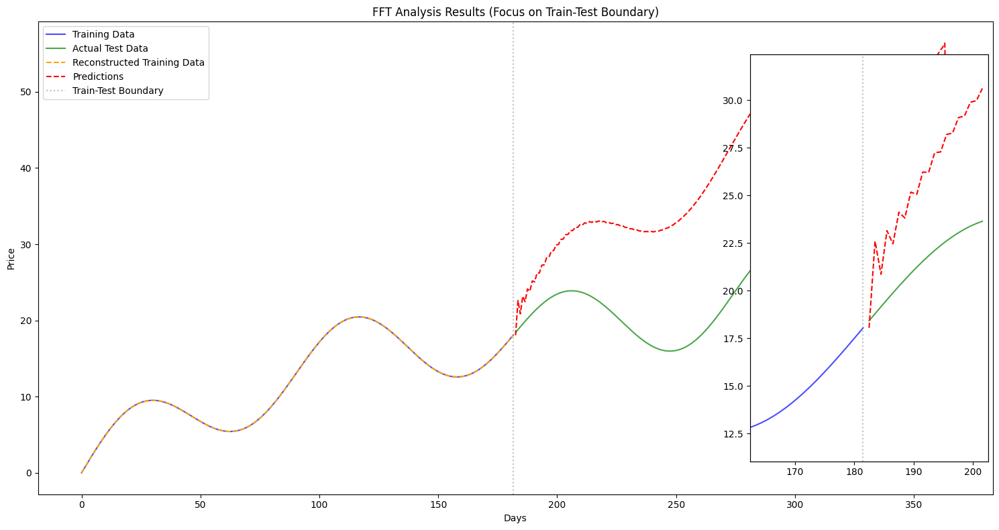

Last training value: 18.05
First prediction value: 18.05
First test value: 18.42

Mean Squared Error: 307.74
R² Score: -9.98


In [163]:

# Let's visualize the results with focus on the boundary
plt.figure(figsize=(15, 8))

# Plot training data and reconstructed training data
plt.plot(t_train, signal_train, label='Training Data', color='blue', alpha=0.7)
plt.plot(t_test, signal_test, label='Actual Test Data', color='green', alpha=0.7)
plt.plot(t_train, reconstructed_train, label='Reconstructed Training Data', color='orange', linestyle='--', alpha=1)



# Generate predictions
predictions = predict_future(t_test, filtered_fft, t_train, signal_train)
plt.plot(t_test, predictions, label='Predictions', color='red', linestyle='--')

# Add vertical line at train-test boundary
plt.axvline(x=t_train[-1], color='gray', linestyle=':', alpha=0.5, label='Train-Test Boundary')

# Zoom in on the boundary region
plt.title('FFT Analysis Results (Focus on Train-Test Boundary)')
plt.xlabel('Days')
plt.ylabel('Price')
plt.legend()

# Add an inset axes to show the boundary in detail
from mpl_toolkits.axes_grid1.inset_locator import zoomed_inset_axes, mark_inset
axins = zoomed_inset_axes(plt.gca(), 2.5, loc='center right')  # zoom factor: 2.5
boundary_index = len(t_train)
window = 20  # number of points to show on either side of boundary

axins.plot(t_train[boundary_index-window:], signal_train[boundary_index-window:], 
          color='blue', alpha=0.7)
axins.plot(t_test[:window], signal_test[:window], color='green', alpha=0.7)
axins.plot(t_test[:window], predictions[:window], color='red', linestyle='--')
axins.axvline(x=t_train[-1], color='gray', linestyle=':', alpha=0.5)

# Set the limits for the inset plot
axins.set_xlim(t_train[-window], t_test[window])
y_min = min(min(signal_train[-window:]), min(signal_test[:window]), min(predictions[:window]))
y_max = max(max(signal_train[-window:]), max(signal_test[:window]), max(predictions[:window]))
margin = (y_max - y_min) * 0.1
axins.set_ylim(y_min - margin, y_max + margin)

# Add connecting lines to show the zoomed region
mark_inset(plt.gca(), axins, loc1=2, loc2=4, fc="none", ec="0.5")

plt.tight_layout()
plt.show()

# Print error metrics and boundary values
print(f'Last training value: {signal_train[-1]:.2f}')
print(f'First prediction value: {predictions[0]:.2f}')
print(f'First test value: {signal_test[0]:.2f}')
print(f'\nMean Squared Error: {mean_squared_error(signal_test, predictions):.2f}')
print(f'R² Score: {r2_score(signal_test, predictions):.2f}')

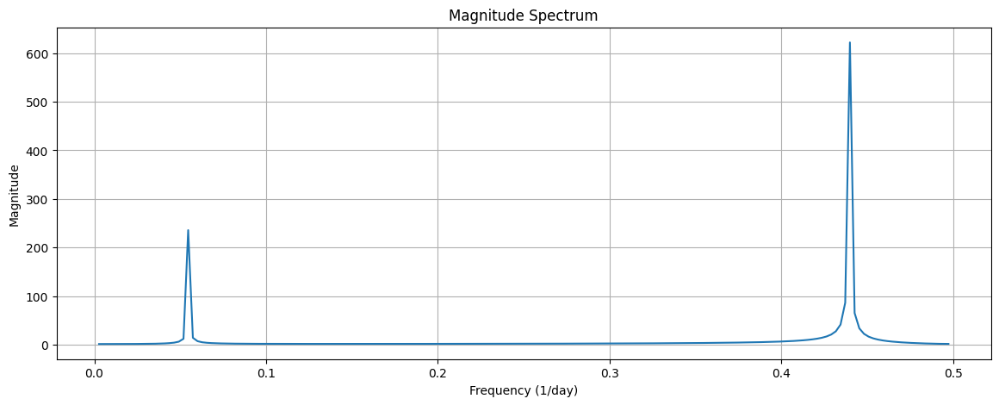

In [227]:
# Generate synthetic data (365 days)
def generate_synthetic_data(n_days=365):
    t = np.linspace(0, n_days, n_days)
    
    f1 = 20
    f2 = 40
    a1 = 1.3
    a2 = 3.5
    # Create a trend
    trend = 0 * t
    # Add seasonal patterns (yearly and quarterly)
    yearly_pattern = a1 * np.sin(f1 * 2 * np.pi * t / 365)
    quarterly_pattern = a2 * np.sin(f2 * 2 * np.pi * t / 91)
    
    # Add some random noise
    noise = np.random.normal(0, 0, n_days)
    
    # Combine all components
    signal = trend + yearly_pattern + quarterly_pattern + noise
    return t, signal

t, y = generate_synthetic_data()

# Compute FFT
fft_vals = np.fft.fft(y)
frequencies = np.fft.fftfreq(len(y), d=(t[1] - t[0]))  # d = time step

# Get magnitude spectrum
magnitude = np.abs(fft_vals)

# Only keep positive frequencies
mask = frequencies > 0
frequencies = frequencies[mask]
magnitude = magnitude[mask]


# Plot magnitude spectrum
plt.figure(figsize=(14, 5))
plt.plot(frequencies, magnitude)
plt.title("Magnitude Spectrum")
plt.xlabel("Frequency (1/day)")
plt.ylabel("Magnitude")
plt.grid(True)
plt.show()

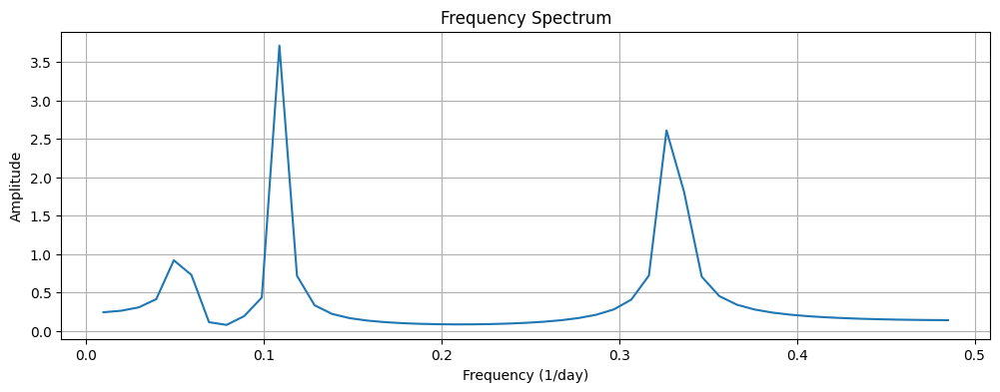

In [258]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import find_peaks

def generate_synthetic_data(n_days=365):
    t = np.linspace(0, n_days, n_days)
    
    f11 = 20
    f12 = 40
    f21 = 60
    f22 = 80

    a11 = 1.3
    a12 = 1.5
    a21 = 3.5
    a22 = 2.5
    
    trend = 0 * t
    yearly_pattern = a11 * np.sin(f11 * 2 * np.pi * t / 365) + a12 * np.cos(f12 * 2 * np.pi * t / 365)
    quarterly_pattern = a21 * np.sin(f21 * 2 * np.pi * t / 91) + a22 * np.cos(f22 * 2 * np.pi * t / 91)
    noise = np.random.normal(0, 0, n_days)
    
    signal = trend + yearly_pattern + quarterly_pattern + noise
    return t, signal, a11, a12, a21, a22

# Generate signal
t, y, a11, a12, a21, a22 = generate_synthetic_data(n_days=100)
N = len(y)
dt = t[1] - t[0]

# FFT
fft_vals = np.fft.fft(y)
frequencies = np.fft.fftfreq(N, d=dt)

amplitudes = np.abs(fft_vals) / (N / 2)


# # Only keep positive frequencies
mask = frequencies > 0
frequencies_pos = frequencies[mask]
amplitudes_pos = amplitudes[mask]
fft_vals_pos = fft_vals[mask]



# # Plot spectrum
plt.figure(figsize=(12, 4))
plt.plot(frequencies_pos, amplitudes_pos)
plt.title("Frequency Spectrum")
plt.xlabel("Frequency (1/day)")
plt.ylabel("Amplitude")
plt.grid(True)
plt.show()

In [280]:
# Get top K components
K = 1000
top_indices = np.argsort(amplitudes_pos)[-K:]

# Create filtered FFT for reconstruction
fft_filtered = np.zeros(N, dtype=complex)
# # # Map back the selected positive frequency components
for idx in top_indices:
    freq_idx = np.where(frequencies == frequencies_pos[idx])[0][0]
    fft_filtered[freq_idx] = fft_vals[freq_idx]
    fft_filtered[-freq_idx] = fft_vals[-freq_idx]  #

fft_filtered

array([   0.        +0.00000000e+00j,   11.99321036+4.45250694e-01j,
         12.95346637+9.36637325e-01j,   15.09630683+1.55387808e+00j,
         20.38006695+2.53516302e+00j,   45.50444909+5.74206634e+00j,
        -36.20088698-2.68600789e+00j,   -5.34894029+1.41110920e+00j,
          1.89307567+3.26000468e+00j,    7.55551315+5.76206238e+00j,
         18.12464291+1.17263602e+01j,  165.53631752+8.42771752e+01j,
        -30.41356075-1.87802601e+01j,  -14.23046744-8.46574342e+00j,
         -9.45257334-5.40035173e+00j,   -7.17861334-3.87581365e+00j,
         -5.88117   -2.93097880e+00j,   -5.07807309-2.26497619e+00j,
         -4.56922946-1.75236882e+00j,   -4.25815407-1.33070878e+00j,
         -4.09476597-9.64540148e-01j,   -4.05335366-6.31259129e-01j,
         -4.12327722-3.14608149e-01j,   -4.3052865 -1.15838878e-03j,
         -4.61106254+3.22062512e-01j,   -5.06554371+6.69761721e-01j,
         -5.71302386+1.06122324e+00j,   -6.63019809+1.52508652e+00j,
         -7.95456567+2.10892943e+0

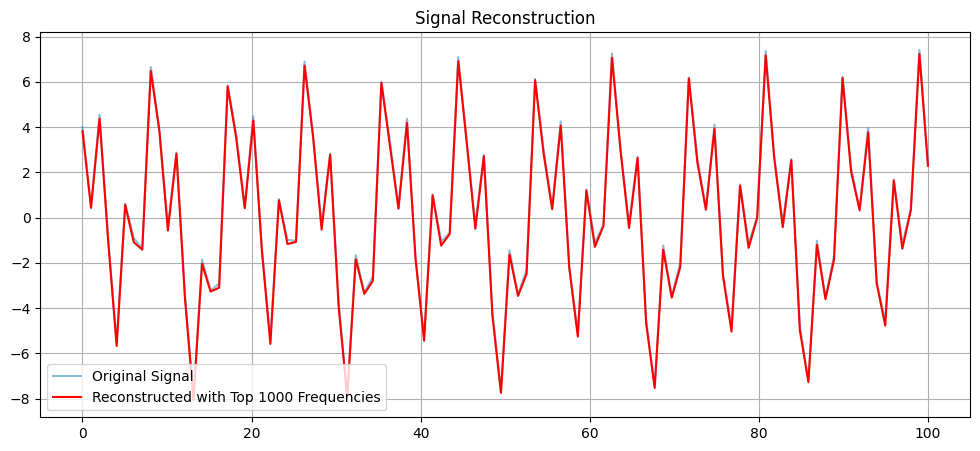

In [281]:
# Inverse FFT to reconstruct signal
reconstructed = np.fft.ifft(fft_filtered).real

# Plot original and reconstructed
plt.figure(figsize=(12, 5))
plt.plot(t, y, label='Original Signal', alpha=0.5)
plt.plot(t, reconstructed, label=f'Reconstructed with Top {K} Frequencies', color='red')
plt.legend()
plt.title("Signal Reconstruction")
plt.grid(True)
plt.show()

[*********************100%***********************]  1 of 1 completed


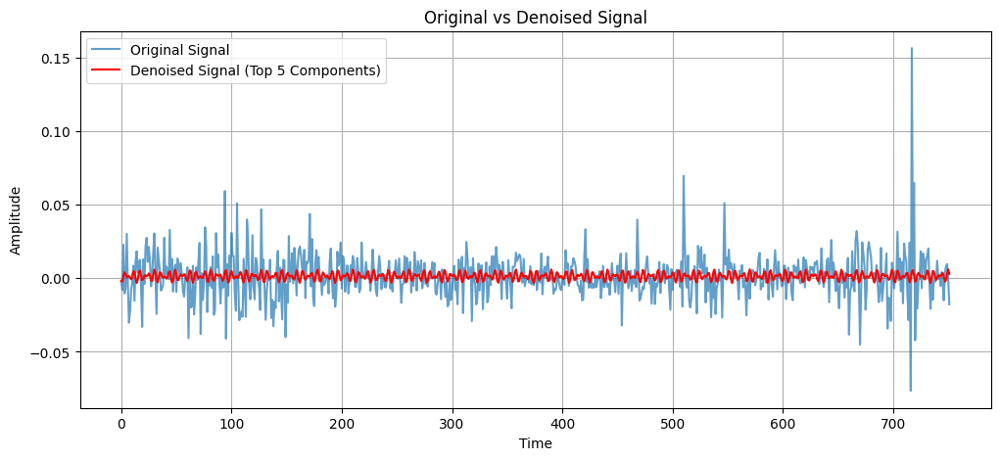

In [5]:
import yfinance as yf
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
def generate_synthetic_data(n_days=365):
    t = np.linspace(0, n_days, n_days)
    
    f11 = 20
    f12 = 40
    f21 = 60
    f22 = 80

    a11 = 8.1
    a12 = 10.1
    a21 = 3.5
    a22 = 2.5
    
    trend = 0.5 * t
    yearly_pattern = a11 * np.sin(f11 * 2 * np.pi * t / 365) + a12 * np.cos(f12 * 2 * np.pi * t / 365)
    quarterly_pattern = a21 * np.sin(f21 * 2 * np.pi * t / 91) + a22 * np.cos(f22 * 2 * np.pi * t / 91)
    noise = np.random.normal(0, 4, n_days)
    
    signal = trend + yearly_pattern + quarterly_pattern + noise
    return t, signal, a11, a12, a21, a22


# Generate data and compute FFT
t, signal, a11, a12, a21, a22 = generate_synthetic_data(59)
from pandas import Timedelta
end_date = '2025-05-30'
days = 365*3
start_date = pd.to_datetime(end_date) - Timedelta(days=days)

data = yf.download('AAPL', start=start_date, end=end_date,multi_level_index=False)
data['pct_change'] = (data['Close'] - data['Open'])/data['Open']
signal = data['pct_change'].values
t = [i for i in range(len(signal))]

fft_vals = np.fft.fft(signal)
magnitudes = np.abs(fft_vals)
frequencies = np.fft.fftfreq(len(signal), d=(t[1] - t[0]))

# Create filtered FFT with top 10 components
df = pd.DataFrame({"FFT": fft_vals, 'frequencies': frequencies, 'magnitudes': magnitudes})
df = df[df['magnitudes'] > 0.1]

# Create full-length FFT array with only top 10 components
fft_denoised = np.zeros_like(fft_vals)
# Create animation showing reconstruction with increasing components
from IPython.display import HTML
import matplotlib.animation as animation

fig, ax = plt.subplots(figsize=(12, 5))

def animate(K):
    ax.clear()
    
    # Get top K components
    top_indices = df.sort_values(by='magnitudes', ascending=False).head(K).index
    fft_denoised = np.zeros_like(fft_vals)
    fft_denoised[top_indices] = fft_vals[top_indices]
    
    # Reconstruct signal
    denoised_signal = np.fft.ifft(fft_denoised).real
    
    # Plot
    ax.plot(t, signal, label='Original Signal', alpha=0.7)
    ax.plot(t, denoised_signal, label=f'Denoised Signal (Top {K} Components)', color='red')
    ax.set_title('Original vs Denoised Signal')
    ax.set_xlabel('Time')
    ax.set_ylabel('Amplitude') 
    ax.legend()
    ax.grid(True)

# Create animation
anim = animation.FuncAnimation(fig, animate, frames=range(5,100), interval=100)
HTML(anim.to_jshtml())


In [28]:
# 1. Get top K frequencies and corresponding FFT values
K = 30
top_k = df.sort_values('magnitudes', ascending=False).head(K)

# 2. Future time range
t_future = np.linspace(t[0], t[-1] + 50, len(t) + 50)  # Extend 50 time steps
t_future
# 3. Reconstruct from selected frequencies
# reconstructed = np.zeros_like(t_future, dtype=float)

# for idx in top_k.index:
#     freq = frequencies[idx]
#     coeff = fft_vals[idx]
    
#     # Only use positive frequencies
#     if freq > 0:
#         amplitude = 2 * np.abs(coeff) / len(signal)  # Normalize and scale
#         phase = np.angle(coeff)
#         reconstructed += amplitude * np.cos(2 * np.pi * freq * t_future + phase)
#         # Add the DC component (mean value)
# dc_idx = np.where(frequencies == 0)[0][0]
# reconstructed += np.abs(fft_vals[dc_idx]) / len(signal)

# # 4. Plot original, fitted and forecasted signals
# plt.figure(figsize=(14,6))

# plt.plot(t[len(t)-100:len(t)], signal[len(t)-100:len(t)], label='Original Signal')
# plt.plot(t_future[len(t)-100:len(t)], reconstructed[len(t)-100:len(t)], label='Fitted Signal', color='green')
# plt.plot(t_future[len(t)-1:], reconstructed[len(t)-1:], label='Forecasted Signal', color='red')
# plt.axvline(x=t[-1], color='gray', linestyle='--', label='Forecast Start')
# plt.legend()
# plt.grid(True)
# plt.title('Fourier Forecast Extension')
# plt.xlabel('Time')
# plt.ylabel('Signal')
# plt.show()


array([  0.,   1.,   2.,   3.,   4.,   5.,   6.,   7.,   8.,   9.,  10.,
        11.,  12.,  13.,  14.,  15.,  16.,  17.,  18.,  19.,  20.,  21.,
        22.,  23.,  24.,  25.,  26.,  27.,  28.,  29.,  30.,  31.,  32.,
        33.,  34.,  35.,  36.,  37.,  38.,  39.,  40.,  41.,  42.,  43.,
        44.,  45.,  46.,  47.,  48.,  49.,  50.,  51.,  52.,  53.,  54.,
        55.,  56.,  57.,  58.,  59.,  60.,  61.,  62.,  63.,  64.,  65.,
        66.,  67.,  68.,  69.,  70.,  71.,  72.,  73.,  74.,  75.,  76.,
        77.,  78.,  79.,  80.,  81.,  82.,  83.,  84.,  85.,  86.,  87.,
        88.,  89.,  90.,  91.,  92.,  93.,  94.,  95.,  96.,  97.,  98.,
        99., 100., 101., 102., 103., 104., 105., 106., 107., 108., 109.,
       110., 111., 112., 113., 114., 115., 116., 117., 118., 119., 120.,
       121., 122., 123., 124., 125., 126., 127., 128., 129., 130., 131.,
       132., 133., 134., 135., 136., 137., 138., 139., 140., 141., 142.,
       143., 144., 145., 146., 147., 148., 149., 15